<style>div.container { width: 100% }</style>
<img style="float:left;  vertical-align:text-bottom;" height="65" width="172" src="./assets/holoviz-logo-unstacked.svg" />


# Seeing the needle AND the haystack: single-datapoint selection for billion-point datasets

*How to view millions or billions of datapoints while allowing precise selection and exploration of the details of individual datapoints.*

<div style="margin: 10px">
    <img style="margin:8px; display:inline; object-fit:scale-down; max-height:65px" src="./assets/datashader.png"/>
    <img style="margin:8px; display:inline; object-fit:scale-down; max-height:65px" src="./assets/bokeh.png"/>
    <img style="margin:8px; display:inline; object-fit:scale-down; max-height:65px" src="./assets/holoviews.png"/>
    <img style="margin:8px; display:inline; object-fit:scale-down; max-height:70px" src="./assets/numba.png"/>
</div>


## 1: Visualizing large data is challenging

#### Large datasets containing millions or billions of records have become common but there are very few tools that can visualize such datasets in their entirety. Even fewer tools also enable interactive exploration and inspection of entire datasets.

* Data is cheap and plentiful but insight is expensive.
* Most plotting tools are not designed to visualize gigabytes of data at a time.
* *Overplotting* is one problem that arises as data density increases.
* Expressing *large dynamic ranges* in the data can also be a problem as sample densities increase.

### Datashader (datashader.org)
 
In 2016, the datashader project set out to see if visualizing billions of samples at once in a meaningful way was possible. Using numba (numba.org) for speed, datashader demonstrated that meaningful, beautiful visualizations were indeed feasible. Here are some examples:

<img src="https://datashader.org/assets/images/usa_census.jpg" width=50%></img>
<img src="https://datashader.org/assets/images/nyc_races.jpg" width=50%></img>

Datashader solves the two key problems with large data as follows:

* Overplotting: samples are *rasterized* to an image on screen by representing the data as a 2D histogram.
* Large dynamic range (parameter-free): colormapping using *histogram equalization* makes much better use of colormaps without having any parameters to tune.

While these are certainly pretty images in which you can spot patterns, it is not possible to query the data in any meaningful way (as these are static images).

## 2. Example dataset: herring gull tracking

To illustrate the datashader API, we will now load a relatively large public dataset. In particular, the [Research Institute for Nature and Forest (INBO)](https://www.vlaanderen.be/inbo/en-gb/homepage/) has been monitoring GPS locations of herring gulls breeding at the North Sea coast of Belgium since 2013. We will now load the 2018 portion of this data:

In [1]:
import pandas as pd
import datashader as ds
import colorcet

In [3]:
df = pd.read_parquet('./data/gulls.parq', engine='fastparquet')
print(f'There are {len(df)/1e6:.2f} million samples in this dataset')
print(f'The columns of this dataframe are: {", ".join(df.columns)}')

There are 2.42 million samples in this dataset
The columns of this dataframe are: longitude, latitude, temperature, heading, height-above-msl, easting, northing


Here is an example of some of the samples in this dataset:

In [4]:
df.head()

,longitude,latitude,temperature,heading,height-above-msl,easting,northing
index,,,,,,,
0,2.819559,50.978461,28.5,220.322155,-7.0,313871.827614,6.617485e+06
1,2.819568,50.978458,33.7,219.465066,-3.0,313872.885149,6.617484e+06
2,2.819568,50.978466,33.5,121.618779,-3.0,313872.918545,6.617486e+06
3,2.819576,50.978476,34.3,121.923660,-2.0,313873.797969,6.617487e+06
4,2.819571,50.978457,32.5,306.500706,0.0,313873.219107,6.617484e+06


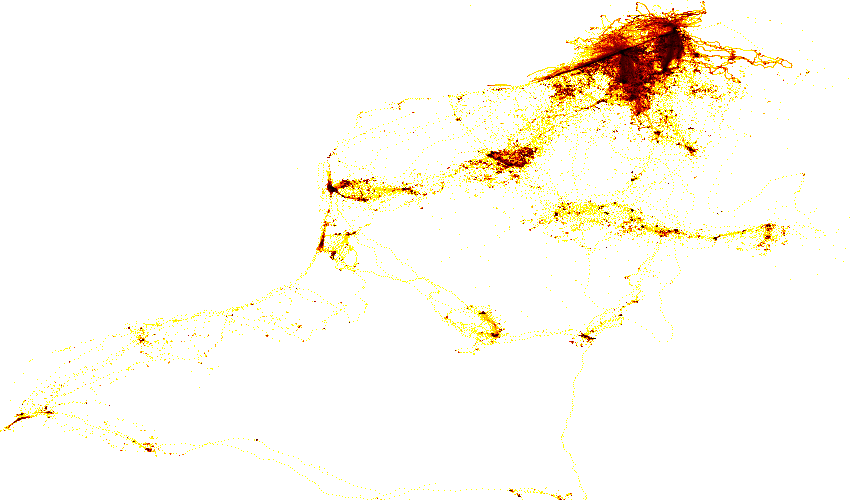

In [5]:
cvs = ds.Canvas(plot_width=850, plot_height=500)
agg = cvs.points(df, 'longitude', 'latitude')
img = ds.tf.shade(agg, cmap=colorcet.CET_L4[::-1], how='eq_hist')
img

This output is simple an RGB image which illustrates the following features of datashader:

*Datashader features (2016)*

| Whole dataset | No overplotting | Full dynamic range |
| --- | --- | --- |
| ✔️ | ✔️ | ✔️ |

However, it is equally clear to anyone used to client-side, interactive plotting that a lot of key features required for data exploration are missing.

## 3. Comparison to interactive plotting

As the visualization above is clearly very limited in its interactivity, it is instructive to compare this output with what is possible with a interactive plotting library. Here we will use Bokeh (bokeh.org) to plot a small subset of the data.

In [9]:
subset = df.sample(frac=0.005)
print('There are {:d}  samples in this subset of the dataset '.format(len(subset)))

There are 12102  samples in this subset of the dataset 


In [10]:
import hvplot.pandas
subset.hvplot(x='easting', y='northing', tiles='ESRI', kind='points', 
              xlabel='longitude', ylabel='latitude', width=900, height=400, hover_cols=list(subset.columns))

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [easting,northing]   (longitude,latitude,temperature,heading,height-above-msl)

Tthe overplotting issue are apparent even with this small slice of the data and we are unable to view the full data distribution. However, we have gained many useful interactive features for exploring the data samples:

*Bokeh features (2016)*

| Whole dataset | No overplotting | Full dynamic range | Panning | Zooming | Tiles | Inspect |
| --- | --- | --- | --- | --- | --- | --- |
| ❌ | ❌ | ❌ | ✔️| ✔️| ✔️| ✔️| ✔️|


## 4. Interactive zooming and panning

In 2017, HoloViews added interactive support for datashader using its streams system which integrates with the Bokeh event system. In 2018, the hvplot (hvplot.holoviz.org) project exposed this functionality with a simpler API that is more familiar to many users.

### Using datashade (RGB image)

With hvplot, you can apply datashader with server-side `eq_hist` (histogram equalization) colormapping with the option `datashade=True`:

In [11]:
df.hvplot(x='easting', y='northing', tiles='ESRI', kind='points', 
              xlabel='longitude', ylabel='latitude', datashade=True, 
          width=900, height=400, cmap=colorcet.CET_L4 )

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [easting,northing]   (R,G,B,A)

Many of the most critical interactive features are now available but there is still no colorbar and no point inspection. This is because datashader is generating an RGB image which is an inappropriate format for these features:

*HoloViews (2017), hvPlot (2018)*

| Whole dataset | No overplotting | Full dynamic range | Panning | Zooming | Tiles | Inspect | Colorbar |
| --- | --- | --- | --- | --- | --- | --- | --- |
| ✔️ | ✔️ | ✔️ | ✔️| ✔️| ✔️| ❌ | ❌ |


### Using rasterize

Alternatively, you can request that datashader skip the server-side colormapping to output the raw aggregated values to the browser, allowing client-side colormapping. This is achieved with the option `rasterize=True`:

In [12]:
df.hvplot(x='easting', y='northing', tiles='ESRI', kind='points', 
          xlabel='longitude', ylabel='latitude', rasterize=True, 
          cmap=colorcet.CET_L4 , colorbar=True, cnorm='log', width=900, height=400) 
# Until recently, could only use linear or log colormapping in cnorm

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [easting,northing]   (easting_northing Count)

Now we have client-side colormapping, the colorbar can be enabled again. The issue now is that until 2021, only linear and log colormapping was available which do not expose the full dynamic range of the data. In addition, the only inspection available is of the aggregated datashader output and not the original data associated with each sample.

*HoloViews (2017), hvPlot (2018)*

| Whole dataset | No overplotting | Full dynamic range | Panning | Zooming | Tiles | Inspect | Colorbar |
| --- | --- | --- | --- | --- | --- | --- | --- |
| ✔️ | ✔️ | ❌ | ✔️| ✔️| ✔️| ❌ | ✔️ |



### Bokeh `eq_hist` colormapping

In Bokeh 2.2, support for histogram equalization colormapping (i.e. `eq_hist`) was added. This means that this colormapping approach can now be used on the output of `rasterize`, exposing the full dynamic range of the data together with a colorbar:

In [13]:
df.hvplot(x='easting', y='northing', tiles='ESRI', kind='points', 
          xlabel='longitude', ylabel='latitude', rasterize=True, 
          cmap=colorcet.CET_L4, colorbar=True, cnorm='eq_hist', width=900, height=400) 

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [easting,northing]   (easting_northing Count)

Now we have all the desired interactive plotting features familiar with small datasets except for the ability to inspect individual samples:

*HoloViews (2021), hvPlot (2021)*

| Whole dataset | No overplotting | Full dynamic range | Panning | Zooming | Tiles | Inspect | Colorbar |
| --- | --- | --- | --- | --- | --- | --- | --- |
| ✔️ | ✔️ | ✔️ | ✔️| ✔️| ✔️| ❌ | ✔️ |


As this table shows, every feature excluding inspection can be achieved with the current [hvplot API](https://hvplot.holoviz.org/). You can learn more about what is possible with `hvplot` at our tutorial tomorrow afternoon!

### Matplotlib panning and zooming <img style="margin:8px; display:inline; object-fit:scale-down; max-height:40px" src="./assets/matplotlib_logo.png"/>

With the recent releases of Datashader (>0.12, released in 2021), you can now use a custom Matplotlib artist for panning and zooming via the `dsshow` function:

In [ ]:
from datashader.mpl_ext import dsshow
%matplotlib widget
dsshow(df, ds.Point('longitude', 'latitude'), norm='eq_hist', cmap=colorcet.CET_L4);

This artist can then be used with the rest of matplotlib, allowing you to add a colorbar a background map and so on.

## 5. Inspecting individual samples

**Problem statement**: *When I see something interesting in the rasterized display, how can I find what datapoints those are?*

At a technical level, the question is then to find and display information about the closest sample to the cursor given its position on a raster image. 

With HoloViews, you can follow the pipeline backwards from the rasterized output of datashader back to the original raw data. This means you can first get the mouse position in the data coordinates of the plot. Then by following the pipeline back to the original dataframe, you can then filter the data down to a small window around that cursor location to find a small number of candidate samples and then the single closest sample. This sample can then be displayed as a Bokeh glyph with the appropriate hover information.

To demonstrate, first let us create a HoloViews tile source in our region-of-interest:

In [14]:
import holoviews as hv
esri = hv.element.tiles.ESRI().redim(x='easting', y='northing').opts(xlim=(1.5e4,4.22e5), ylim=(6.25e6,6.7e6))
esri

:Tiles   [easting,northing]

Now we can use the HoloViews API to wrap our raw datas in a `hv.Points` object which we then rasterize and overlay over this ESRI tile source:

In [15]:
points = hv.Points(df, kdims=['easting', 'northing'])
raster = hv.operation.datashader.rasterize(points).opts(cmap=colorcet.CET_L4, 
                                                        cnorm='eq_hist', width=800, colorbar=True)
esri * raster

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [easting,northing]
      .Image.I :Image   [easting,northing]   (easting_northing Count)

So far this visualization adds no new features and simply expresses the last `.hvplot` output with the HoloViews API. However, using the new `inspect` operation we can build a `highlight` object that makes inspection information available:

In [16]:
highlight   = hv.operation.datashader.inspect(raster)
esri * raster * highlight.opts(marker='o', size=10, fill_alpha=0, color='white',  tools=["hover"])

:DynamicMap   []
   :Overlay
      .Tiles.I  :Tiles   [easting,northing]
      .Image.I  :Image   [easting,northing]   (easting_northing Count)
      .Points.I :Points   [easting,northing]   (longitude,latitude,temperature,heading,height-above-msl)

With this new feature (current experimental, API still being finalized) we now have all the interactive plotting conveniences familiar when working with small data but for the entire dataset:

*HoloViews (2021, version 1.14.4 with further integration and improvements planned)*

| Whole dataset | No overplotting | Full dynamic range | Panning | Zooming | Tiles | Inspect | Colorbar |
| --- | --- | --- | --- | --- | --- | --- | --- |
| ✔️ | ✔️ | ✔️ | ✔️| ✔️| ✔️| ✔️ | ✔️ |

## 6. Using panel to turn this into a servable dashboard

This new functionality is part of the wider HoloViz (holoviz.org) ecosystem which allows you to turn these kind of visualizations into dashboards using panel (panel.holoviz.org).

In [ ]:
import panel as pn
points = hv.Points(df, kdims=['easting', 'northing'])
raster = hv.operation.datashader.rasterize(points).opts(cnorm='eq_hist', 
                                                        cmap=colorcet.CET_L4[::-1], responsive=True, colorbar=True)
highlight   = hv.operation.datashader.inspect(raster).opts(marker='o', size=10, fill_alpha=0, 
                                                           color='white',  tools=["hover"])
overlay = esri * raster.opts(cmap='fire', cnorm='eq_hist', min_height=400) * highlight
description = """
This dashboard shows how easy it is to go from an aggregate view of 2.4 million points
down to the details of a single GPS sample.
"""
pn.Column('## Gull tracking dashboard', description, overlay, sizing_mode='stretch_both' ).servable()

The `panel serve` command will serve any panel marked `.servable()` in the notebook as a dashboard. To learn more about [panel](https://panel.holoviz.org/) and how to quickly turn notebooks into dashboards, visit the [holoviz tutorial](https://holoviz.org/tutorial/index.html).

### Conclusion

Since the initial release of datashader in 2016, the HoloViz ecosystem has worked to make interactive plotting features available for working with large datasets. With the addition of client-side `eq_hist` colormapping in Bokeh and the new `inspect` operation in HoloViews in 2021, it is now possible to work with large data in the same way as you can currently work with smaller datasets.

While this talk has mainly focused on interactivity with Bokeh, note that the `inspect` tool is designed to also work with the HoloViews Plotly backend.

This means you can see *all* your data (gigabytes at a time) while also allowing you to interactively link and drilldown to view the detailed information for subsets and individual data points.

### Future (ongoing) work

While the inspect operation is already very useful, we plan to extend its functionality in a number of ways:

* We will be integrating this functionality with the `.hvplot` API to make it even more accessible. This includes working well with the linked selections and drilldown functionality.
* Ongoing work adding support for curves, paths and other shapes:

<img src="./assets/inspect_curves.gif" width=100%></img>

### Other demos of `inspect`

Here are two other examples demonstrating the power of the new `inspect` operation:

* [`nyc_buildings`](https://examples.pyviz.org/nyc_buildings/nyc_buildings.html#nyc-buildings-gallery-nyc-buildings): This inspection approach works for polygons as demonstrated by this example which plots the outlines of all the buildings in New York City (original data from nyc.gov).
* [`ship_traffic`](https://examples.pyviz.org/ship_traffic/ship_traffic.html#ship-traffic-gallery-ship-traffic): This example shows the inspection approach working on 200 million AIS pings for ships sailing around the west coast of the US. This are transponder pings that record (among other things) the ship's position, type and heading. This example uses custom hooks to show a table of the inspected point as well as a photograph of the ship (when available).

This [project](https://anaconda-project.readthedocs.io/) can be downloaded from `https://anaconda.org/pyviz/project/needles_in_the_haystack`.

## Preprocessing the data

The raw data can be found online [here](https://zenodo.org/record/3541812/files/HG_OOSTENDE-gps-2018.csv). If you download this CSV file to `./data/HG_OOSTENDE-gps-2018.csv`, you can apply the basic cleanup needed to generate `gulls.parq` using the script included here:

<br>

<details>
    <br><tt>
import numpy as np <br>
import pandas as pd <br>
from holoviews.util.transform import lon_lat_to_easting_northing <br><br>

usecols = ['location-long', 'location-lat', 'external-temperature', 'heading', 'height-above-msl']<br>
df = pd.read_csv('./data/HG_OOSTENDE-gps-2018.csv', usecols=usecols)<br>
df.columns = ['longitude', 'latitude', 'temperature', 'heading', 'height-above-msl']<br><br>

sliced = df[(df['longitude'] > 0) & (df['longitude'] < 4) & (df['latitude'] > 49) & (df['latitude'] < 51.5)]<br><br>

x,y = lon_lat_to_easting_northing(sliced.longitude, sliced.latitude)<br>
projected = sliced.join([pd.DataFrame({'easting': x}), pd.DataFrame({'northing': y})])<br>
projected.to_parquet('./data/gulls.parq', 'fastparquet', compression='gzip',<br>
                     file_scheme='simple')<br>
</tt>
</details>